In [1]:
import sys
import pandas as pd
from matplotlib import pyplot as plt
from scipy import stats
from sklearn.model_selection import train_test_split

sys.path.insert(1, '../')

from rule_extraction import *

%load_ext autoreload
%autoreload 2
%matplotlib widget

In [2]:
dataPairs = []

directories = []
for root, dirs, files in os.walk("../../data/data-cluster-examples-pause"):
    for name in dirs:
        directories.append(os.path.join(root, name))


for directory in directories:
    print(f"Processing {directory}")

    # if "fallingDrop" not in directory:
    #     print(f"Skipping {directory}")
    #     continue

    files = os.listdir(directory)

    # group files by time AutoPas_liveInfoLogger_Rank0_$2024-05-21_14-24-17$
    data_pairs = {}
    for file in files:
        if "tuningData" in file or "liveInfo" in file:
            time = file.split("_")[-1]

            if not time in data_pairs:
                data_pairs[time] = [None, None]

            if "tuningData" in file:
                data_pairs[time][1] = pd.read_csv(
                    os.path.join(directory, file))
            elif "liveInfo" in file:
                data_pairs[time][0] = pd.read_csv(
                    os.path.join(directory, file))

    # check if tuning and liveInfo files are present
    for time, pair in data_pairs.items():
        if pair[0] is None or pair[1] is None:
            print(f"Missing file for {directory} at time {time}")
            continue

    # filter rows where NaN is present

    for time, (liveInfo, tuningData) in data_pairs.items():
        tuning_iterations = tuningData["Iteration"]

        corresponding_liveInfo = liveInfo.loc[liveInfo["Iteration"].isin(
            tuning_iterations)]

        # assert len(corresponding_liveInfo) == len(
        #     tuningData), "Length of liveInfo and tuningData does not match"

        # strip columns
        corresponding_liveInfo.columns = corresponding_liveInfo.columns.str.strip()
        tuningData.columns = tuningData.columns.str.strip()

        # merge container and Data Layout
        tuningData["ContainerDataLayout"] = tuningData["Container"] + \
            "_" + tuningData["Data Layout"]

        # tuningData.drop(columns=["Container", "Data Layout"], inplace=True)

        dataPairs.append((corresponding_liveInfo, tuningData))

        # describe data
        # print(f"Time: {time}")
        # print(corresponding_liveInfo["avgParticlesPerCell"].describe())
        # print("")

Processing ../../data/data-cluster-examples-pause/uniformCube_b_2
Processing ../../data/data-cluster-examples-pause/uniform_cube_a_2
Processing ../../data/data-cluster-examples-pause/uniform_cube_a_1
Processing ../../data/data-cluster-examples-pause/explodingLiquid_1
Processing ../../data/data-cluster-examples-pause/SpinodalDecomposition_equilibration_1
Processing ../../data/data-cluster-examples-pause/SpinodalDecomposition_equilibration_2
Processing ../../data/data-cluster-examples-pause/explodingLiquid_2
Processing ../../data/data-cluster-examples-pause/fallingDrop_2
Processing ../../data/data-cluster-examples-pause/uniformCube_b_1
Processing ../../data/data-cluster-examples-pause/SpinodalDecomposition_2
Processing ../../data/data-cluster-examples-pause/fallingDrop_1
Processing ../../data/data-cluster-examples-pause/SpinodalDecomposition_1


# Load Data from Folders


In [3]:
df = pd.DataFrame()

for batch, (X, y) in enumerate(dataPairs):
    merged = pd.merge(X, y, on="Iteration")
    df = pd.concat([df, merged])

df = df.drop(columns=["Iteration", "Date_x", "Date_y"])
df = df.drop(list(df.filter(regex='sample')), axis=1)
df.shape

(180529, 30)

In [4]:
df.describe()

df.head(10)

,avgParticlesPerCell,cutoff,domainSizeX,domainSizeY,domainSizeZ,estimatedNumNeighborInteractions,homogeneity,maxDensity,maxParticlesPerCell,minParticlesPerCell,...,threadCount,Container,CellSizeFactor,Traversal,Load Estimator,Data Layout,Newton 3,Reduced,Smoothed,ContainerDataLayout
0,0.905797,3.0,93.75,78.75,68.75,85652,0.035863,0.107635,8,0,...,12,LinkedCells,1.0,lc_c01,none,AoS,disabled,22964350.0,22964350.0,LinkedCells_AoS
1,0.905797,3.0,93.75,78.75,68.75,85652,0.035863,0.107635,8,0,...,12,LinkedCells,1.0,lc_c01,none,SoA,disabled,21511665.0,21511665.0,LinkedCells_SoA
2,0.905797,3.0,93.75,78.75,68.75,85652,0.035863,0.107635,8,0,...,12,LinkedCells,1.0,lc_c04,none,AoS,disabled,19633948.0,19633948.0,LinkedCells_AoS
3,0.905797,3.0,93.75,78.75,68.75,85652,0.035863,0.107635,8,0,...,12,LinkedCells,1.0,lc_c04,none,AoS,enabled,13421045.0,13421045.0,LinkedCells_AoS
4,0.905797,3.0,93.75,78.75,68.75,85652,0.035863,0.107635,8,0,...,12,LinkedCells,1.0,lc_c04,none,SoA,disabled,20298967.0,20298967.0,LinkedCells_SoA
5,0.905797,3.0,93.75,78.75,68.75,85652,0.035863,0.107635,8,0,...,12,LinkedCells,1.0,lc_c04,none,SoA,enabled,14474746.0,14474746.0,LinkedCells_SoA
6,0.905797,3.0,93.75,78.75,68.75,85652,0.035863,0.107635,8,0,...,12,LinkedCells,1.0,lc_c08,none,AoS,disabled,19792369.0,19792369.0,LinkedCells_AoS
7,0.905797,3.0,93.75,78.75,68.75,85652,0.035863,0.107635,8,0,...,12,LinkedCells,1.0,lc_c08,none,AoS,enabled,13082756.0,13082756.0,LinkedCells_AoS
8,0.905797,3.0,93.75,78.75,68.75,85652,0.035863,0.107635,8,0,...,12,LinkedCells,1.0,lc_c08,none,SoA,disabled,19870901.0,19870901.0,LinkedCells_SoA
9,0.905797,3.0,93.75,78.75,68.75,85652,0.035863,0.107635,8,0,...,12,LinkedCells,1.0,lc_c08,none,SoA,enabled,13517639.0,13517639.0,LinkedCells_SoA


In [5]:
df.columns

Index(['avgParticlesPerCell', 'cutoff', 'domainSizeX', 'domainSizeY',
       'domainSizeZ', 'estimatedNumNeighborInteractions', 'homogeneity',
       'maxDensity', 'maxParticlesPerCell', 'minParticlesPerCell', 'numCells',
       'numEmptyCells', 'numHaloParticles', 'numParticles', 'particleSize',
       'particleSizeNeededByFunctor', 'particlesPerBlurredCellStdDev',
       'particlesPerCellStdDev', 'rebuildFrequency', 'skin', 'threadCount',
       'Container', 'CellSizeFactor', 'Traversal', 'Load Estimator',
       'Data Layout', 'Newton 3', 'Reduced', 'Smoothed',
       'ContainerDataLayout'],
      dtype='object')

# Define Interesting Data to observe


In [6]:
inputs = [
    "avgParticlesPerCell",
    # "cutoff",
    # "domainSizeX",
    # "domainSizeY",
    # "domainSizeZ",
    # "estimatedNumNeighborInteractions",
    'homogeneity',
    'maxDensity',
    "maxParticlesPerCell",
    # "minParticlesPerCell",
    # "numCells",
    # "numEmptyCells",
    # "numHaloParticles",
    # "numParticles",
    # "particleSize",
    # "particleSizeNeededByFunctor",
    # "particlesPerBlurredCellStdDev",
    "particlesPerCellStdDev",
    # "rebuildFrequency",
    # "skin",
    "threadCount",
]

outputs = [
    "ContainerDataLayout",
    # "Container",
    # "Data Layout",
    # "CellSizeFactor",
    "Traversal",
    # "Load Estimator",
    "Newton 3",
]

In [7]:
df.columns

Index(['avgParticlesPerCell', 'cutoff', 'domainSizeX', 'domainSizeY',
       'domainSizeZ', 'estimatedNumNeighborInteractions', 'homogeneity',
       'maxDensity', 'maxParticlesPerCell', 'minParticlesPerCell', 'numCells',
       'numEmptyCells', 'numHaloParticles', 'numParticles', 'particleSize',
       'particleSizeNeededByFunctor', 'particlesPerBlurredCellStdDev',
       'particlesPerCellStdDev', 'rebuildFrequency', 'skin', 'threadCount',
       'Container', 'CellSizeFactor', 'Traversal', 'Load Estimator',
       'Data Layout', 'Newton 3', 'Reduced', 'Smoothed',
       'ContainerDataLayout'],
      dtype='object')

In [8]:
group_by = [
    "avgParticlesPerCell",
    "cutoff",
    "domainSizeX",
    "domainSizeY",
    "domainSizeZ",
    "estimatedNumNeighborInteractions",
    'homogeneity',
    'maxDensity',
    "maxParticlesPerCell",
    "minParticlesPerCell",
    "numCells",
    "numEmptyCells",
    "numHaloParticles",
    "numParticles",
    "particleSize",
    "particleSizeNeededByFunctor",
    "particlesPerBlurredCellStdDev",
    "particlesPerCellStdDev",
    "rebuildFrequency",
    "skin",
    "threadCount",
]


# only keep rows where performance percentage is above x
print("Orignal length", len(df))

# group data on input columns
grouped = df.groupby(group_by)


def add_Speedup_column(group):
    min_smoothed = group['Smoothed'].min()
    result = group.copy()
    result['speedup'] = min_smoothed / result['Smoothed']
    return result


grouped_speedup = grouped.apply(
    add_Speedup_column).reset_index(drop=True)

grouped_speedup.drop(columns=["Smoothed", "Reduced"], inplace=True)

#ungroup
data=grouped_speedup.reset_index(drop=True)


Orignal length 180529


/tmp/ipykernel_331249/810863334.py:40: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  grouped_speedup = grouped.apply(


In [9]:
Z_THRESHHOLD = 3
for column in inputs:
    z = np.abs(stats.zscore(data[column]))
    data = data[z < Z_THRESHHOLD]

print("Outliers removed length", len(data))


# filter values occuring less than pct
SPARSE_CUTOFF = 0.01
for column in outputs:
    counts = data[column].value_counts()

    sparse_values = data[column].isin(
        counts[counts > len(data) * SPARSE_CUTOFF].index)

    data = data[sparse_values]


print("Sparse values removed length", len(data))



Outliers removed length 167440
Sparse values removed length 159600


      ContainerDataLayout   speedup
0  VerletClusterLists_AoS  0.328181
1         LinkedCells_AoS  0.415509
2         VerletLists_AoS  0.490252
3         LinkedCells_SoA  0.554632
4    VerletListsCells_SoA  0.568857
5         VerletLists_SoA  0.601487
6  VerletClusterLists_SoA  0.652546
7    VerletListsCells_AoS  0.688386


/tmp/ipykernel_331249/234118968.py:22: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(['{:,.0%}'.format(x) for x in vals])


                Traversal   speedup
0                  lc_c01  0.386034
1        vcl_c01_balanced  0.407351
2   vcl_cluster_iteration  0.431296
3                  lc_c18  0.447879
4                  lc_c08  0.471831
5      lc_sliced_balanced  0.492039
6                  lc_c04  0.496710
7           lc_sliced_c02  0.519514
8               lc_sliced  0.525000
9       vl_list_iteration  0.545870
10                vcl_c06  0.559908
11                vlc_c01  0.577438
12                vlc_c18  0.617881
13         vlc_sliced_c02  0.659022
14    vlc_sliced_balanced  0.667670


/tmp/ipykernel_331249/234118968.py:22: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(['{:,.0%}'.format(x) for x in vals])


   Newton 3   speedup
0  disabled  0.441147
1   enabled  0.633453


/tmp/ipykernel_331249/234118968.py:22: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(['{:,.0%}'.format(x) for x in vals])


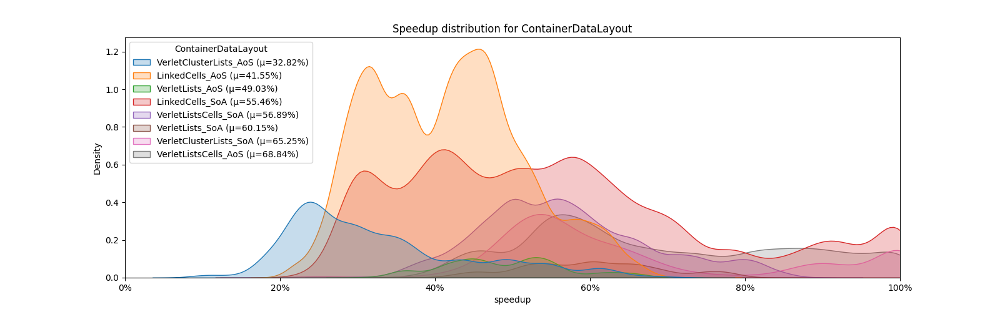

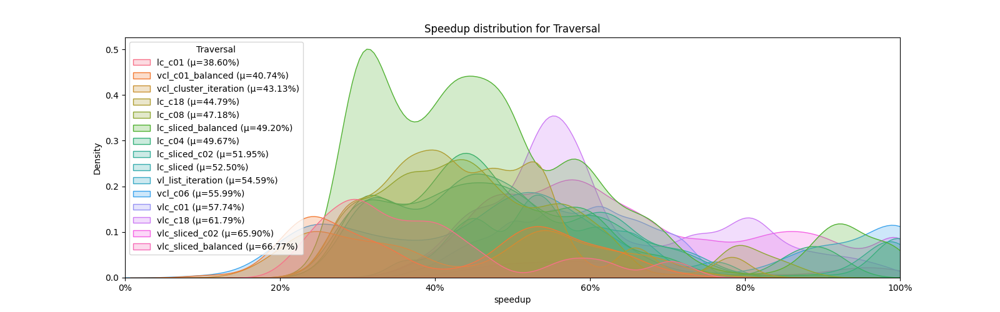

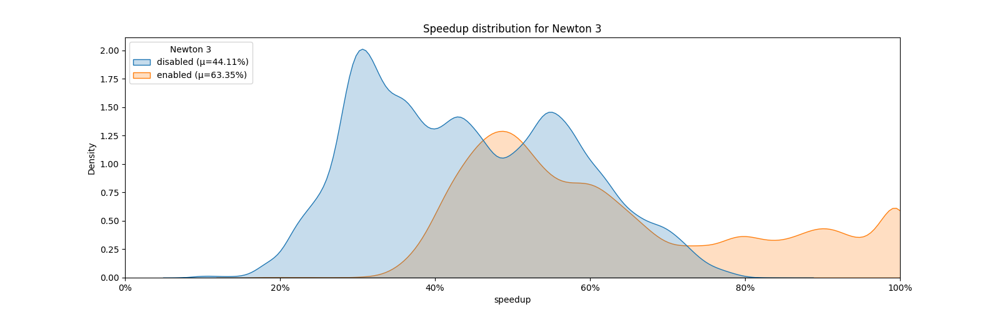

In [10]:
# go through all output columns sorte by expected value of speedup
for column in outputs:

    expected_speedup = data.groupby(
        column)["speedup"].mean().sort_values().reset_index()

    # extract first column

    print(expected_speedup)

    fig, ax = plt.subplots(1, 1, figsize=(16, 5))

    hue_order = expected_speedup[column].values

    sns.kdeplot(data=data, x="speedup", hue=column,
                ax=ax, fill=True, hue_order=hue_order)

    ax.set_xlim(0, 1)

    # set x axis to percentage
    vals = ax.get_xticks()
    ax.set_xticklabels(['{:,.0%}'.format(x) for x in vals])

    #set legend top left
    sns.move_legend(ax, "upper left")

    # change legend to include expected value of speedup
    for t in ax.get_legend().texts:
        t.set_text(f"{t.get_text()} (µ={
                   100*expected_speedup.loc[expected_speedup[column] == t.get_text()]['speedup'].values[0]:.2f}%)")

    ax.set_title(f"Speedup distribution for {column}")

    fig.savefig(f"speedup_{column}.png", dpi=300)

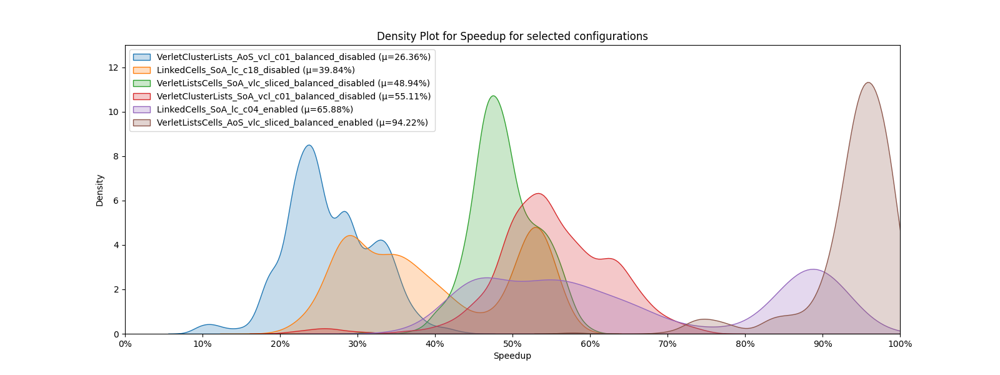

In [11]:
# sort group on outputs and order groups by mean speedup
data_group_output = data.groupby(outputs)

best_configs = []

for group in data_group_output:
    group_name = group[0]
    group_data = group[1]

    best_configs.append((group_data["speedup"].mean(), group))

best_configs.sort(key=lambda x: x[0], reverse=False)
# remove speedup


# drop index


# make plot for best configurations
fig, ax = plt.subplots(1, 1, figsize=(16, 6))

taken_idx = []

for i, (speedup, group) in enumerate(best_configs):
    # ignore bin at 1
    filtered = group[1].loc[group[1]["speedup"] != 1]

    config = (group[0][0]+"_" + group[0][1]+"_" + group[0][2])

    if len(filtered) <= 2:
        continue

    if i % 10 != 0 and not (i == len(best_configs)-1 or i == 0):
        continue
    taken_idx.append(i)
    sns.kdeplot(filtered["speedup"], ax=ax, label=config, fill=True)

    # histogram
    # ax.hist(filtered["speedup"], bins=100, density=True, alpha=0.6, label=config)
ax.set_xlim(0, 1)
ax.set_ylim(0, 13)

# set x-axis to percentage
# only 0.2 steps on x-axis
ax.set_xticks(np.linspace(0, 1, 11))

ax.set_xticklabels(['{:,.0%}'.format(x) for x in ax.get_xticks()])


ax.set_title("Density Plot for Speedup for selected configurations")
ax.set_xlabel("Speedup")
ax.set_ylabel("Density")
ax.legend(loc='upper center')
sns.move_legend(ax, "upper left")

for i, t in enumerate(ax.get_legend().texts):
    t.set_text(f"{t.get_text()} (µ={100*best_configs[taken_idx[i]][0]:.2f}%)")


fig.savefig("speedup_density_configurations.png", dpi=300)

# Create Train and Test Data


In [12]:
relevantData=data[inputs+outputs+["speedup"]]

X_train, X_test, y_train, y_test = train_test_split(
    relevantData.drop(columns=["speedup"]), pd.DataFrame(relevantData["speedup"])
    , test_size=0.2, random_state=42)

# save to csv
pd.concat([X_train, y_train], axis=1).to_pickle("train.pkl")
pd.concat([X_test, y_test], axis=1).to_pickle("test.pkl")

In [13]:
1/7

0.14285714285714285

# Final Data


In [14]:
SUITABILITY_LABELS = ["terrible", "rubbish", "bad", "medium", "ok", "good", "excellent"]
y_train_suited = pd.cut(y_train["speedup"], 7, labels=SUITABILITY_LABELS)
pd.concat([X_train, y_train["speedup"], y_train_suited], axis=1)



,avgParticlesPerCell,homogeneity,maxDensity,maxParticlesPerCell,particlesPerCellStdDev,threadCount,ContainerDataLayout,Traversal,Newton 3,speedup,speedup
49450,0.905797,0.035496,0.531948,23,0.012989,1,LinkedCells_AoS,lc_sliced,enabled,0.450641,bad
167724,2.201487,0.086152,0.627706,13,0.014430,24,VerletListsCells_AoS,vlc_sliced_balanced,disabled,0.594117,medium
92462,0.905797,0.043115,0.319169,18,0.013617,4,LinkedCells_AoS,lc_sliced_c02,enabled,0.454632,bad
151117,0.944637,0.083797,0.691920,22,0.040474,28,VerletClusterLists_AoS,vcl_c06,disabled,0.319094,rubbish
91781,0.905797,0.043133,0.315623,19,0.013579,28,VerletListsCells_AoS,vlc_sliced_c02,disabled,0.673052,ok
...,...,...,...,...,...,...,...,...,...,...,...
133714,0.944637,0.079441,0.554280,21,0.040082,12,LinkedCells_SoA,lc_sliced_c02,enabled,0.989101,excellent
117529,0.944637,0.070202,0.305040,8,0.033701,1,VerletListsCells_SoA,vlc_c18,disabled,0.495985,medium
145767,0.944637,0.077611,0.483600,22,0.040346,12,VerletClusterLists_AoS,vcl_c06,disabled,0.238614,rubbish
160702,0.944637,0.085856,0.468720,21,0.040808,28,LinkedCells_SoA,lc_sliced,enabled,0.984618,excellent


# Train Decision Tree and Extract Rules


In [15]:
# number of input parameters that can be used simultaneously
POSSIBLE_NUMBER_OF_COMBINATIONS = [2, 3, 4, 5]


from collections import defaultdict 
CCP_ALPHA = defaultdict(lambda: 0.05)

# maximum depth of the decision tree
MAX_DEPTH = 10

# how many models should be created for each label
TOP_K_MODELS_PER_LABEL = 1


In [16]:
# go through all batches of grouped train data



In [17]:
auto_rules:dict = {}

output_variables=[]

print("Number of configs", len(X_train.groupby(outputs)))

for config, group in pd.concat([X_train, y_train], axis=1).groupby(outputs):
    #join tuple 
    name = "Suitability "+ "_".join([str(v) for c, v in zip(outputs, config)])

    data=group[inputs]
    pred=group["speedup"]

    # add category column to y train based on speedup

    def mapping(value):
        label= SUITABILITY_LABELS[min(int(value * len(SUITABILITY_LABELS)), len(SUITABILITY_LABELS)-1)]
        return f"{label}"

    y_train_labels=pd.DataFrame()
    y_train_labels[name]=pred.apply(mapping)

    output_variables.append(name)


    new_rules = create_auto_rules(data, y_train_labels, None,
                               POSSIBLE_NUMBER_OF_COMBINATIONS, CCP_ALPHA, MAX_DEPTH, TOP_K_MODELS_PER_LABEL,plot=False)

    auto_rules.update(new_rules)


Number of configs 50
Training on 2511 samples
Suitability LinkedCells_AoS_lc_c01_disabled: ['homogeneity', 'maxDensity', 'particlesPerCellStdDev', 'threadCount'] (score=0.95)
Number of rules 10:
	Suitability LinkedCells_AoS_lc_c01_disabled (10 rules)
Training on 2550 samples
Suitability LinkedCells_AoS_lc_c04_disabled: ['homogeneity', 'maxDensity', 'maxParticlesPerCell', 'threadCount'] (score=0.76)
Number of rules 10:
	Suitability LinkedCells_AoS_lc_c04_disabled (10 rules)
Training on 2536 samples
Suitability LinkedCells_AoS_lc_c04_enabled: ['maxDensity', 'threadCount'] (score=0.86)
Number of rules 5:
	Suitability LinkedCells_AoS_lc_c04_enabled (5 rules)
Training on 2527 samples
Suitability LinkedCells_AoS_lc_c08_disabled: ['particlesPerCellStdDev', 'threadCount'] (score=0.84)
Number of rules 4:
	Suitability LinkedCells_AoS_lc_c08_disabled (4 rules)
Training on 2499 samples
Suitability LinkedCells_AoS_lc_c08_enabled: ['avgParticlesPerCell', 'particlesPerCellStdDev', 'threadCount'] (sco

threadCount: [-inf, 1.482, 1.678, 2.5, 2.766, 3.344, 3.576, 3.58, 3.826, 3.986, 5.959, 6.252, 7.319, 7.395, 7.571, 8.0, 10.337, 11.341, 11.522, 11.944, 14.044, 16.51, 16.573, 17.19, 18.0, 19.901, 20.176, 23.426, 23.769, 24.249, 26.0, 26.092, 26.523, inf]
threadCount: [-inf, 1.482, 1.678, 2.5, 2.766, 3.344, 3.576, 3.826, 5.959, 6.252, 7.319, 7.571, 8.0, 10.337, 11.341, 11.522, 11.944, 14.044, 16.51, 17.19, 18.0, 19.901, 20.176, 23.426, 23.769, 24.249, 26.0, 26.523, inf]

particlesPerCellStdDev: [-inf, 0.009, 0.011, 0.013, 0.014, 0.015, 0.016, 0.018, 0.019, 0.02, 0.021, 0.023, 0.024, 0.025, 0.027, 0.029, 0.034, 0.036, 0.039, 0.04, 0.041, 0.042, 0.043, 0.044, inf]
particlesPerCellStdDev: [-inf, 0.009, 0.011, 0.013, 0.014, 0.015, 0.016, 0.018, 0.019, 0.02, 0.021, 0.023, 0.024, 0.025, 0.027, 0.029, 0.034, 0.036, 0.039, 0.04, 0.041, 0.042, 0.043, 0.044, inf]

maxDensity: [-inf, 0.118, 0.137, 0.144, 0.176, 0.186, 0.227, 0.243, 0.268, 0.278, 0.302, 0.314, 0.328, 0.337, 0.349, 0.356, 0.367, 0.3

/home/manuel/AutoPas-FuzzyTuning-Bachelor-Thesis/data-analysis/../demo/fuzzy-test/python/fuzzy_system.py:409: RuntimeWarning: overflow encountered in exp
  def function(x): return 1 / (1 + np.exp(-width * (x - center)))


delta_x = 0.0870972097392018, number of points = 9.472174854628774, should be at least 10
delta_x = 0.0016588289796319856, number of points = 9.0425234814308, should be at least 10
delta_x = 0.04713900654018589, number of points = 9.164384905560603, should be at least 10


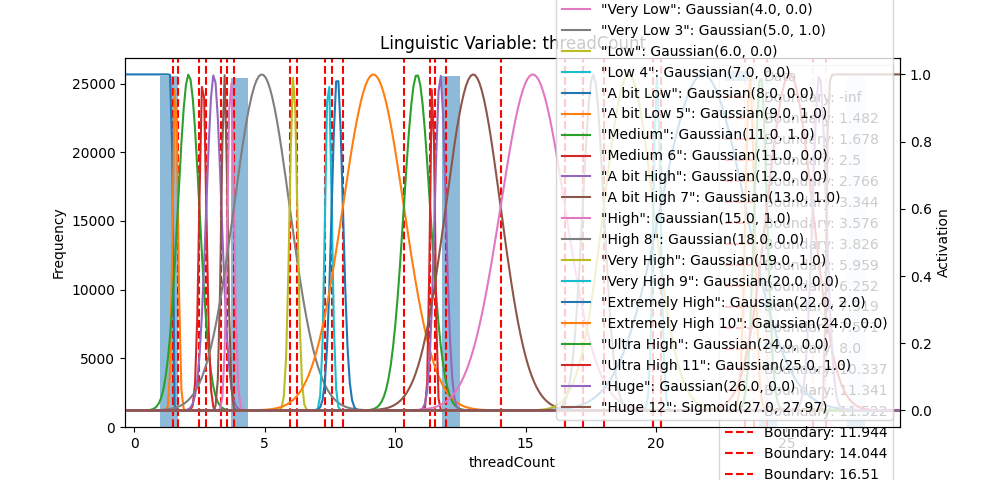

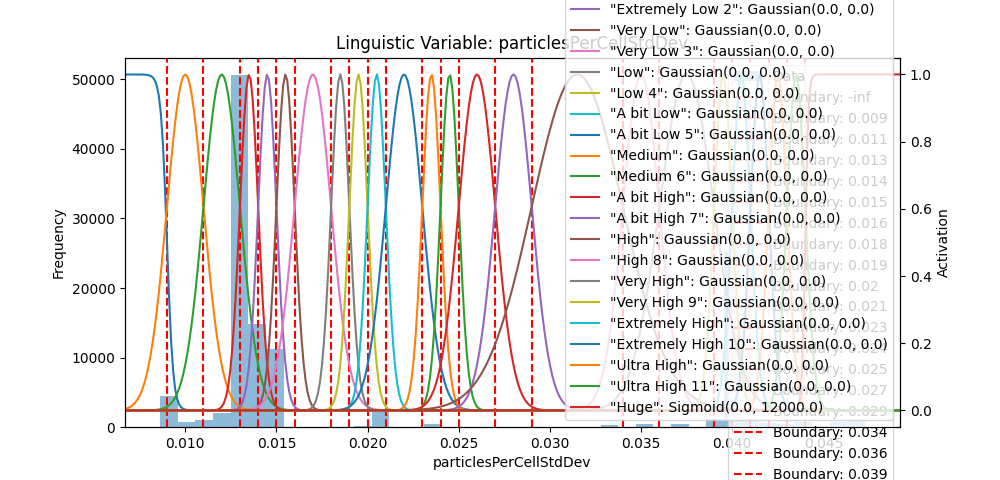

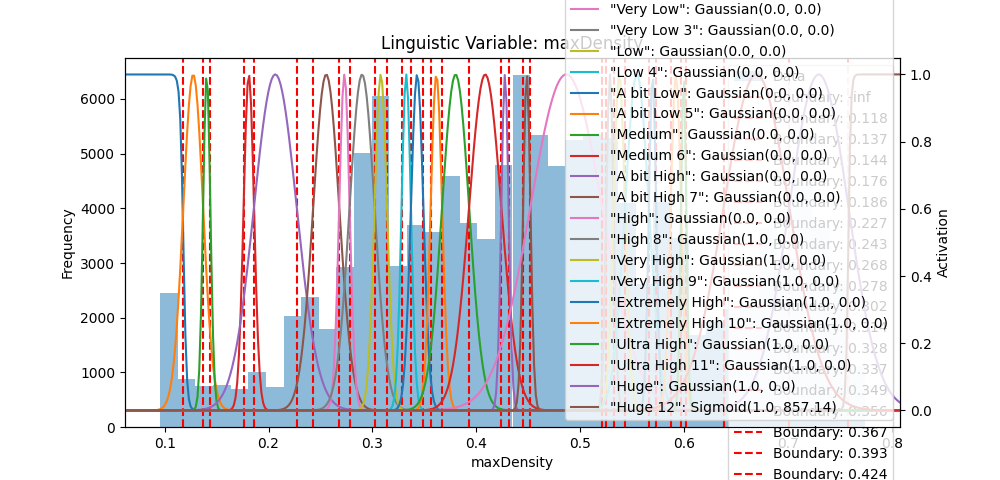

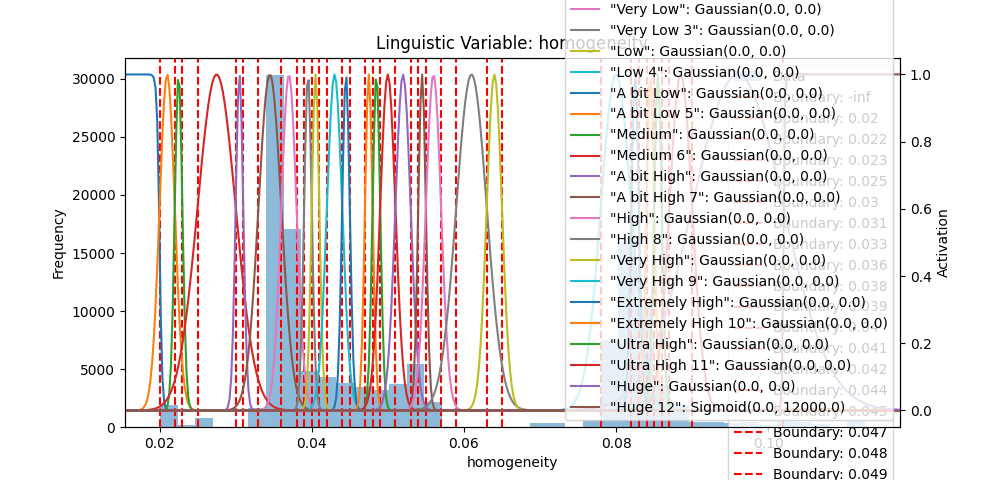

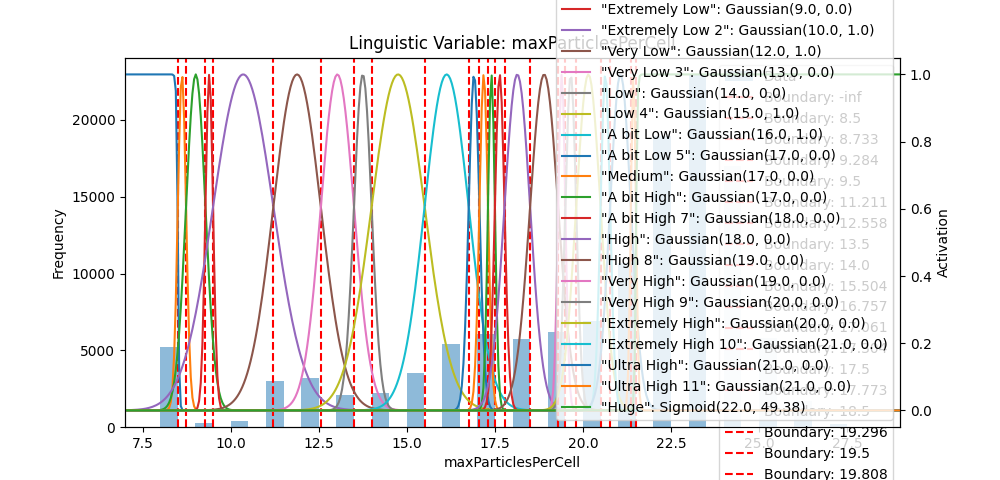

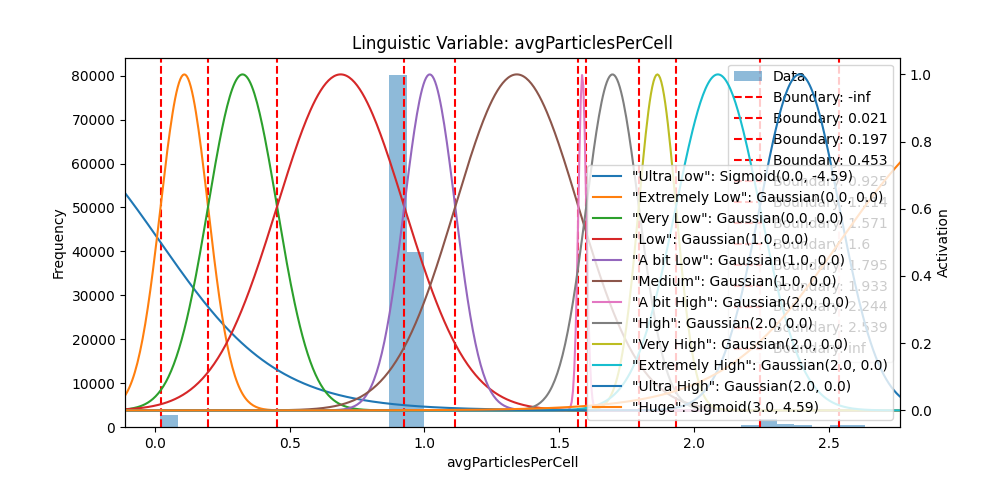

In [18]:
inputs_approach1, rules_approach1 = create_rules_approach1(
    X_train, auto_rules)

# Aproach 2

Follows https://www.sciencedirect.com/science/article/pii/S0165011406002533


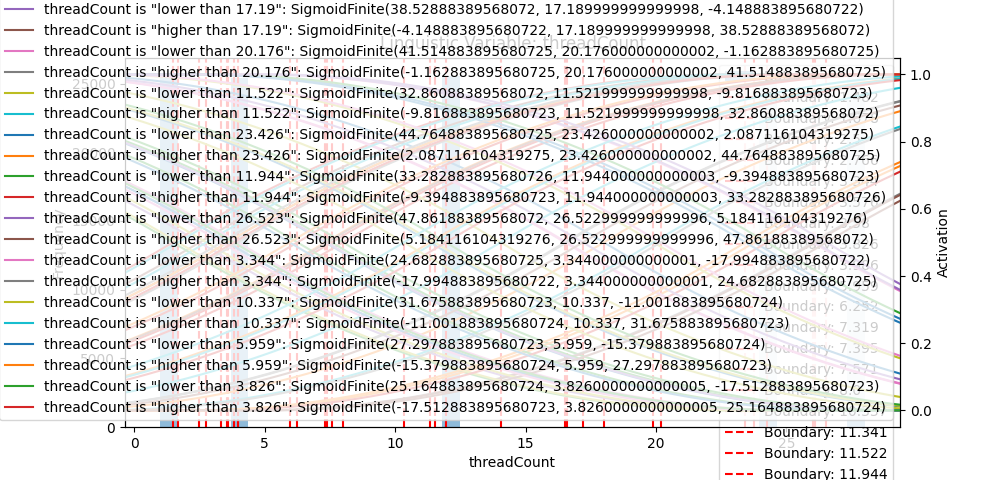

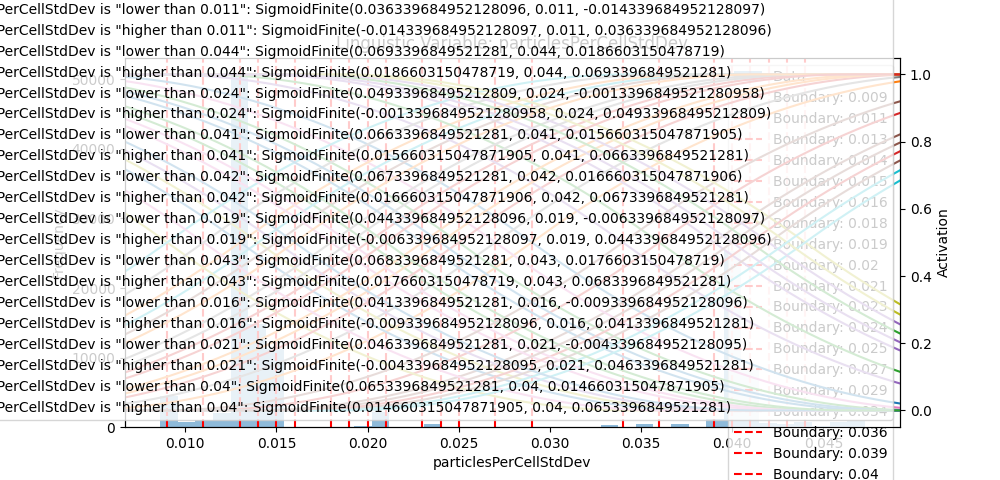

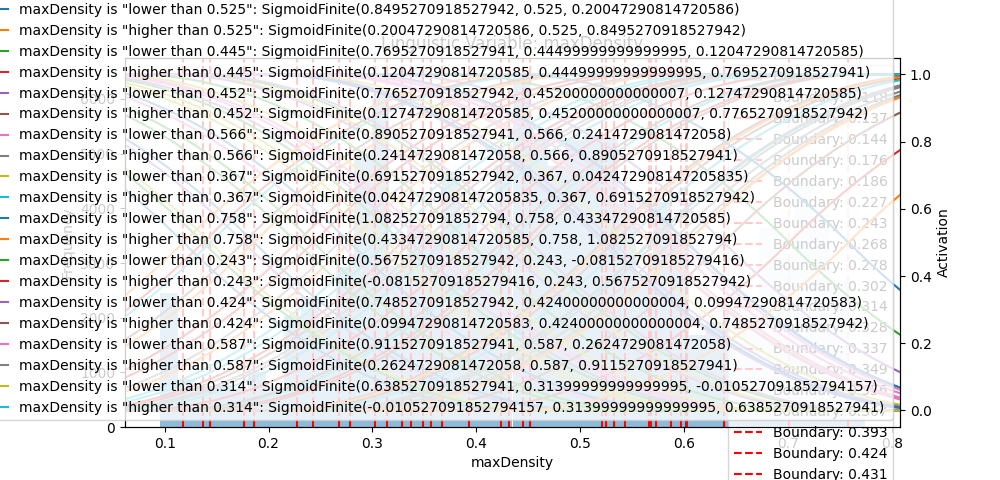

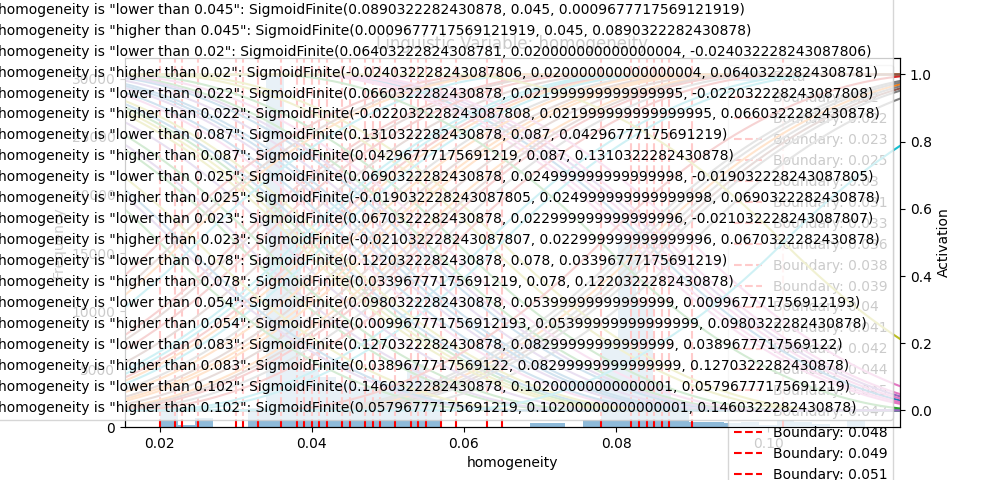

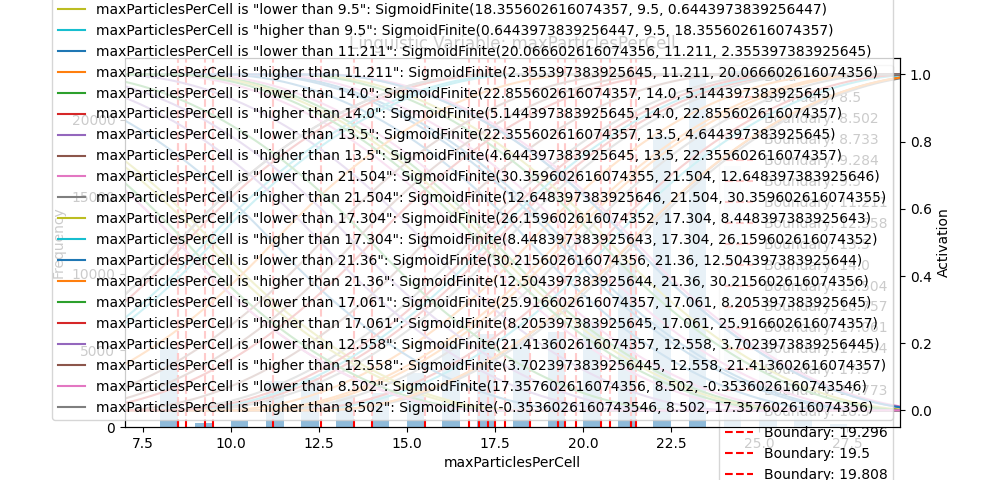

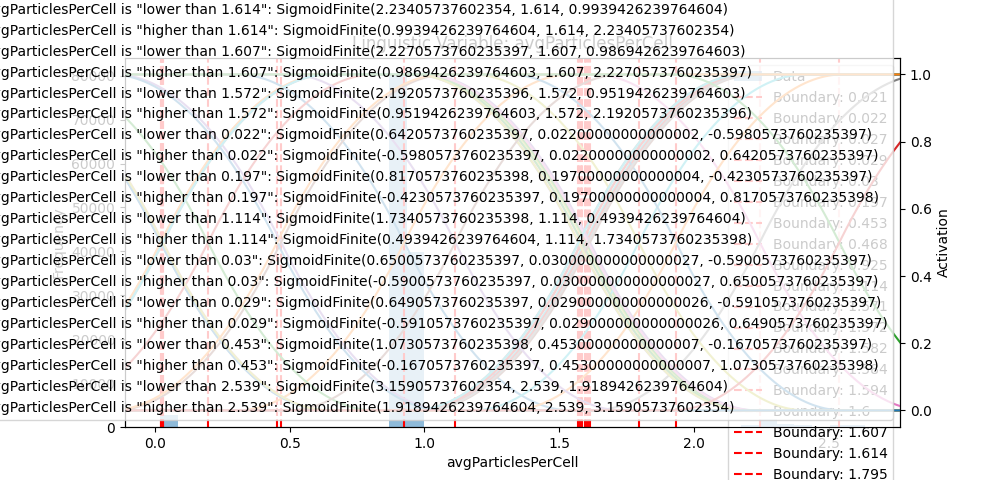

In [19]:
inputs_approach_2, rules_approach2 = create_rules_approach2(
    X_train, auto_rules)

In [25]:
def make_direct_output_membership_functions(output_variables):
    outputRangeMembershipFunctions: dict[str, LinguisticVariable] = {}

    for col in output_variables:

        split_values = SUITABILITY_LABELS

        col="Configuration_i"


        base_set = Set(Set.SetType.CONTINUOUS, (0, 1))
        crisp_set = CrispSet({(col, base_set)})

        outputRangeMembershipFunctions[col] = LinguisticVariable(crisp_set)

        for i, entry in enumerate(split_values):
            spacing = 1/(len(split_values)+1)
            mean = (i+1)*spacing
            std = 2*(spacing/len(split_values))

            if i==0 or i==len(split_values)-1:
                std=std*2
                factor= -1 if i==0 else 1
                shifted_centre=mean-factor*0.05
                outputRangeMembershipFunctions[col].add_linguistic_term(
                    Sigmoid(entry, shifted_centre, 30*factor))
            else:

                outputRangeMembershipFunctions[col].add_linguistic_term(
                    Gaussian(entry, mean, std))

    return outputRangeMembershipFunctions

outputRangeMembershipFunctions = make_direct_output_membership_functions(output_variables)


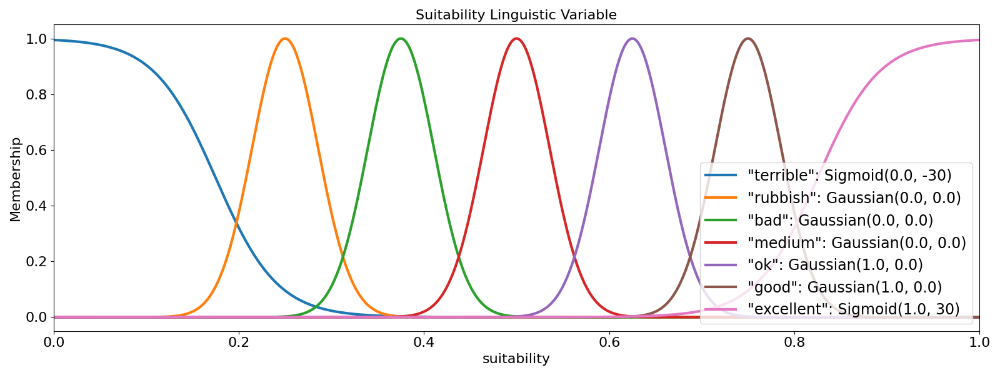

In [31]:
fig, ax = plt.subplots(1, 1, figsize=(16, 6))

next(iter(outputRangeMembershipFunctions.values())).plot(ax, n=1000)

ax.set_title("Suitability Linguistic Variable")
ax.set_xlabel("suitability")
ax.set_ylabel("Membership")

ax.set_xlim(0, 1)


# set fontsize to 14
for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
             ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(16)

    # if line is dashed

    # legend size
    ax.legend(prop={'size': 15}, loc="lower right")

    # make lines bold
    for line in ax.get_lines():
        line.set_linewidth(3)
        # if line is dashed
        if line.get_linestyle() == "--":
            line.set_linewidth(2)


fig.tight_layout()

ax.legend(prop={'size': 17}, loc="lower right")


fig.savefig("output_membership_functions.png", dpi=300)

In [22]:
display(rules_to_table(rules_approach2, "Approach 2"))

/home/manuel/AutoPas-FuzzyTuning-Bachelor-Thesis/data-analysis/cluster-examples-pause-suitability/../rule_extraction.py:939: FutureWarning: Styler.applymap has been deprecated. Use Styler.map instead.
  table = table.applymap(
/home/manuel/AutoPas-FuzzyTuning-Bachelor-Thesis/data-analysis/cluster-examples-pause-suitability/../rule_extraction.py:942: FutureWarning: Styler.applymap has been deprecated. Use Styler.map instead.
  table = table.applymap(


# Save all the data


In [23]:
save_linguistic_variables(inputs_approach1, "approach1/fuzzy-inputs.txt")
save_linguistic_variables(outputRangeMembershipFunctions,
                          "approach1/fuzzy-outputs.txt")

save_fuzzy_rules(rules_approach1, "approach1/fuzzy-rules.txt")


save_linguistic_variables(inputs_approach_2, "approach2/fuzzy-inputs.txt")
save_linguistic_variables(outputRangeMembershipFunctions,
                          "approach2/fuzzy-outputs.txt")

save_fuzzy_rules(rules_approach2, "approach2/fuzzy-rules.txt")